<a href="https://colab.research.google.com/github/Brittbijquestionmark/logo_detection/blob/master/Evaluate_Test_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%matplotlib inline
# warnings.filterwarnings('ignore')

# Load the Drive helper and mount
from google.colab import drive, files

# This will prompt for authorization.
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!ls "/content/drive/My Drive/data"

!pip install opencv-python
!pip install tensorflow==1.13.1
!pip install tensorflow-gpu==1.13.1
!pip install keras==2.3.0
!pip install imageai

import os
from pathlib import Path
from imageai.Detection.Custom import CustomObjectDetection
from imageai.Detection.Custom import DetectionModelTrainer
from matplotlib import pyplot
from matplotlib.patches import Rectangle
from matplotlib import text
import math as m

import tensorflow as tf

from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
import matplotlib.pyplot as plt
from IPython.display import Image 

import argparse
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow
import scipy.io
import scipy.misc
import numpy as np
import pandas as pd
import PIL
import tensorflow as tf
from keras import backend as K
from keras.layers import Input, Lambda, Conv2D
from keras.models import load_model, Model

import glob
import xml.etree.ElementTree as ET
import lxml.etree as ETT

from sklearn.metrics import confusion_matrix
import itertools



Alles		 logs	    train	    validation
annotations.csv  model.png  train_img.gdoc  ztest_ongelabeld
cache		 models     train_img.txt   ztrain
json		 test	    train.txt	    zvalidation
     |████████████████████████████████| 92.5MB 34kB/s 
     |████████████████████████████████| 51kB 7.9MB/s 
     |████████████████████████████████| 3.2MB 45.7MB/s 
     |████████████████████████████████| 368kB 54.1MB/s 
  Found existing installation: tensorboard 2.3.0
    Uninstalling tensorboard-2.3.0:
      Successfully uninstalled tensorboard-2.3.0
  Found existing installation: tensorflow-estimator 2.3.0
    Uninstalling tensorflow-estimator-2.3.0:
      Successfully uninstalled tensorflow-estimator-2.3.0
  Found existing installation: tensorflow 2.3.0
    Uninstalling tensorflow-2.3.0:
      Successfully uninstalled tensorflow-2.3.0
     |████████████████████████████████| 345.2MB 19kB/s 
     |████████████████████████████████| 378kB 7.7MB/s 
  Found existing installation: Keras 2.4.3
    Uninstalling

Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:529: FutureWarn

In [3]:
# Your data and model directories here
DATA_DIR = "/content/drive/My Drive/data/"
MODEL_PATH = "/content/drive/My Drive/data/models/detection_model-ex-071--loss-0001.957.h5"
JSON_PATH = "/content/drive/My Drive/data/json/detection_config.json"
IMAGE_DIR = "/content/drive/My Drive/data/test_images/"
RESULTS_DIR = "/content/drive/My Drive/data/test_results/"
TEST_DIR = "/content/drive/My Drive/data/test/"

In [4]:
def iou(box1, box2):
    # Assign variable names to coordinates for clarity
    (box1_x1, box1_y1, box1_x2, box1_y2) = box1
    (box2_x1, box2_y1, box2_x2, box2_y2) = box2
    
    # Calculate the (yi1, xi1, yi2, xi2) coordinates of the intersection of box1 and box2. Calculate its Area.
    xi1 = max(box1_x1, box2_x1)
    yi1 = max(box1_y1, box2_y1)
    xi2 = min(box1_x2, box2_x2)
    yi2 = min(box1_y2, box2_y2)
    inter_width = max(xi2-xi1, 0)
    inter_height = max(yi2-yi1,0)
    inter_area = inter_width * inter_height

    # Calculate the Union area by using Formula: Union(A,B) = A + B - Inter(A,B)
    box1_area = (box1_x2-box1_x1)* (box1_y2-box1_y1)
    box2_area = (box2_x2-box2_x1)* (box2_y2-box2_y1)
    union_area = box1_area + box2_area - inter_area
    
    # compute the IoU
    iou = inter_area / union_area
    return iou

def yolo_non_max_suppression(scores, boxes, classes, max_boxes = 10, iou_threshold = 0.5): 
    #sorteer op probabilities van hoog naar laag
    sorted_scr = (-scores).argsort()
    scores = scores[sorted_scr]
    boxes = boxes[sorted_scr]
    classes = classes[sorted_scr]
    
    #maak behoudvector aan voor administratie 
    keep = [True]*len(scores)

    #itereer over alle boxes
    for i in range(len(scores)):
      if keep[i] == True :
        #itereer over alle (daarna) volgende boxes
        for j in range(i+1, len(scores)):
          if (iou(boxes[i], boxes[j]) > iou_threshold) and (keep[j] == True) :  #(classes[i] == classes[j]) and 
            #gooi weg als iou te groot is
            keep[j] = False

    keep = np.array(keep)
    return [scores[keep], boxes[keep], classes[keep]]   


# returns list of labels for image path
def what_labels_in_xml(image_path):
  xml_path = image_path.replace('.jpg', '.xml').replace('/images/','/annotations/')
  tree = ET.parse(xml_path)
  root = tree.getroot()
  km = []
  for member in root.findall('object'):
    km.append(member[0].text)
  return(km)

In [19]:
#load model
model = tf.keras.models.load_model(MODEL_PATH)

In [20]:
 # Set model type
trainer = DetectionModelTrainer()
trainer.setModelTypeAsYOLOv3()
# Data folder
trainer.setDataDirectory(data_directory=DATA_DIR)

labels = [
          'asc',
          'beterleven1',
          'beterleven2',
          'beterleven3',
          'bio',
          'demeter',
          'eko',
          'fairtrade',
          'msc',
          'organic',
          'planetproof',
          'rfalliance',
          'utz',
          'vegan',             
          'weidemelk'
    ]

# Training configuration
trainer.setGpuUsage(1) # "Runtime -> Change runtime type" moet GPU zijn
trainer.setTrainConfig(
    object_names_array=labels,
    batch_size=4, # batch size is zo klein omdat je anders OOM errors krijgt
                  # Out of Memory. Plaatjes zijn 700x700x3. Best wel groot.
    num_experiments=100,
    train_from_pretrained_model=MODEL_PATH,
)


Generating anchor boxes for training images and annotation...
Average IOU for 9 anchors: 0.76
Anchor Boxes generated.
Detection configuration saved in  /content/drive/My Drive/data/json/detection_config.json


In [21]:
#set metrics
metrics = trainer.evaluateModel(model_path=MODEL_PATH, json_path=JSON_PATH, iou_threshold=0.2, object_threshold=0.8, nms_threshold=0.5)


Starting Model evaluation....


/usr/local/lib/python3.6/dist-packages/keras/engine/saving.py:341: UserWarning: No training configuration found in save file: the model was *not* compiled. Compile it manually.
  warnings.warn('No training configuration found in save file: '


Model File:  /content/drive/My Drive/data/models/detection_model-ex-071--loss-0001.957.h5 

Using IoU :  0.2
Using Object Threshold :  0.8
Using Non-Maximum Suppression :  0.5
asc: 0.8089
beterleven1: 0.9112
beterleven2: 0.8571
beterleven3: 0.9286
bio: 0.9909
demeter: 1.0000
eko: 0.9578
fairtrade: 0.9862
msc: 0.8790
organic: 0.9594
planetproof: 0.9421
rfalliance: 1.0000
utz: 1.0000
vegan: 0.8333
weidemelk: 0.9496
mAP: 0.9336


In [26]:
#compile model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [27]:
#make dataframe of test directory with FILENAME, CLASS, BOX (xmin, ymin, xmax, ymax)
def xml_to_csv(path):
    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        for member in root.findall('object'):
            value = (root.find('filename').text,
                     member[0].text,
                     int(member[4][0].text),
                     int(member[4][1].text),
                     int(member[4][2].text),
                     int(member[4][3].text)
                     )
            xml_list.append(value)
    column_name = ['filename', 'label_true', 'xmin', 'ymin', 'xmax', 'ymax'] #'width', 'height',
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

# writes all xml files into one dataframe
def transformers_assemble(directory):
    image_path = os.path.join(directory, 'annotations')
    xml_df = xml_to_csv(image_path)
    xml_df.to_csv(image_path + '.csv', index=None)
    return xml_df

df_true = transformers_assemble(TEST_DIR)


In [28]:
# plot the image
def plot_yolo(image_path, f, probs, boksen, klassen):
  image = pyplot.imread(image_path + f)
  pyplot.imshow(image)
  # get the context for drawing boxes
  ax = pyplot.gca()
  # get coordinates from the first face
  print('Prediction (+ certainty)')
  for i in range(len(probs)):
      # set propper coordinates
      x, y, x2, y2 = boksen[i]
      width = x2-x
      height = y2-y
      # create the rectangle
      rect = Rectangle((x, y), width, height, fill=False, color='red')
      # draw the box
      ax.add_patch(rect)
      # add name and probabilty
      ax.annotate(klassen[i] + ' '+ str(m.ceil(probs[i])), (x,y), color='blue')
      print(klassen[i], ":",str(m.ceil(probs[i])), "%")
  pyplot.show()

beterleven225.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 100 %


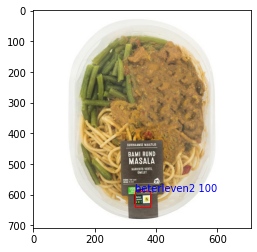

------------------------------------------------------
beterleven328.jpg
True certificates: ['beterleven3', 'beterleven3']
Prediction (+ certainty)
beterleven3 : 100 %


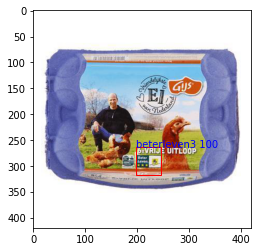

------------------------------------------------------
7c4a8e7914aecc9625e8c1e17ec79133.jpg
True certificates: ['utz']
Prediction (+ certainty)
utz : 100 %


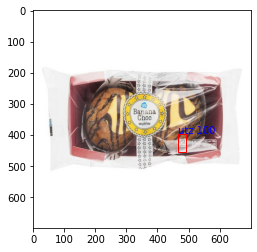

------------------------------------------------------
asc67.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 99 %
asc : 99 %


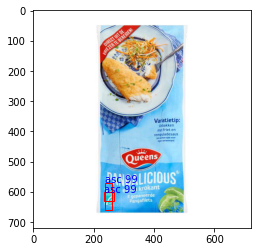

------------------------------------------------------
beterleven164.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 100 %


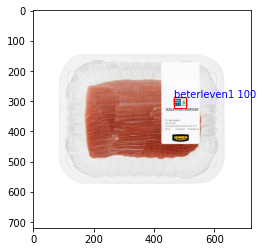

------------------------------------------------------
f17050b661da313799786a9bc56e2004.jpg
True certificates: ['fairtrade', 'organic']
Prediction (+ certainty)
fairtrade : 100 %
organic : 100 %
fairtrade : 95 %


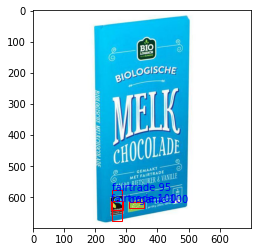

------------------------------------------------------
beterleven160.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 100 %


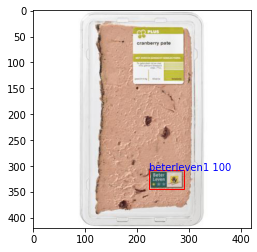

------------------------------------------------------
9f7d1dddced9bf3d163dd824c03844fc.jpg
True certificates: ['utz']
Prediction (+ certainty)
utz : 100 %
utz : 95 %


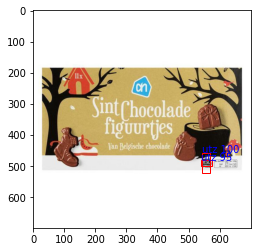

------------------------------------------------------
demeter45.jpg
True certificates: ['demeter']
Prediction (+ certainty)
demeter : 100 %


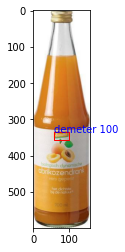

------------------------------------------------------
e25b403edee4d102d719b49533f7f33c.jpg
True certificates: ['utz']
Prediction (+ certainty)
utz : 100 %
utz : 94 %


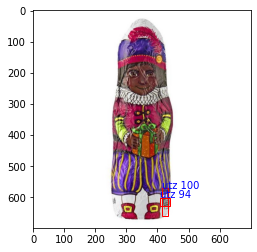

------------------------------------------------------
a5caab629b470336e5ab9dc4c30b47a1.jpg
True certificates: ['weidemelk', 'planetproof']
Prediction (+ certainty)
weidemelk : 100 %
planetproof : 100 %
weidemelk : 100 %
planetproof : 100 %


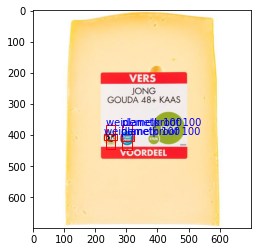

------------------------------------------------------
msc65.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


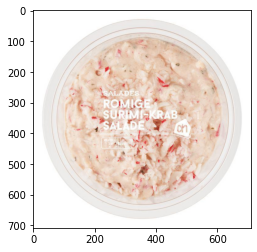

------------------------------------------------------
8967c9dbe7e2ce70660f94dd8066c133.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 100 %


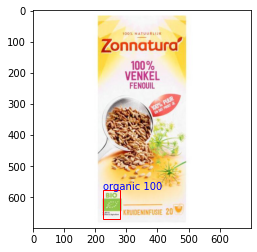

------------------------------------------------------
beterleven329.jpg
True certificates: ['beterleven3']
Prediction (+ certainty)
beterleven3 : 100 %


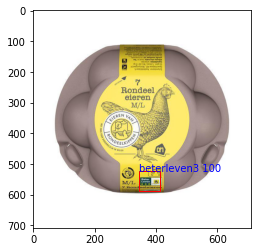

------------------------------------------------------
rfalliance38.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


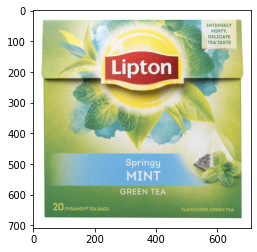

------------------------------------------------------
asc98.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 98 %


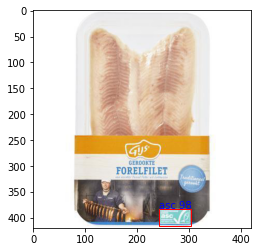

------------------------------------------------------
planetproof5.jpg
True certificates: ['planetproof', 'weidemelk']
Prediction (+ certainty)
weidemelk : 100 %
weidemelk : 100 %
planetproof : 100 %
planetproof : 72 %


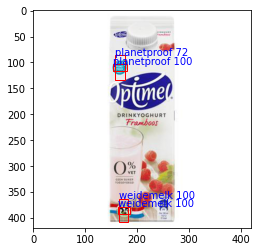

------------------------------------------------------
asc4.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 100 %


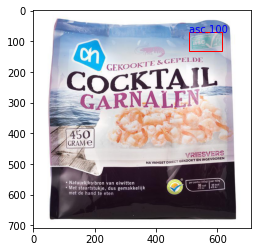

------------------------------------------------------
01dba2920bfdac843b9701f79cdccfbc.jpg
True certificates: ['fairtrade']
Prediction (+ certainty)
fairtrade : 100 %


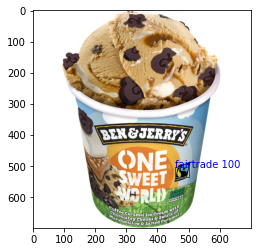

------------------------------------------------------
00bdfa461e7a1156fcf2dbc6ab14dc1f.jpg
True certificates: ['fairtrade']
Prediction (+ certainty)
fairtrade : 96 %
fairtrade : 95 %


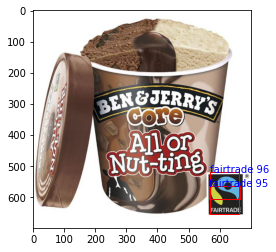

------------------------------------------------------
beterleven130.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


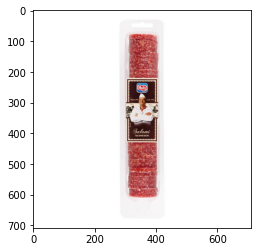

------------------------------------------------------
e807e6c629ebdb24eef06cd3ed6dec3a.jpg
True certificates: ['organic']
Geen keurmerk gescout!
Prediction (+ certainty)


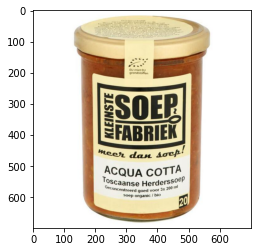

------------------------------------------------------
5fae81387d526bda47bfde8c82270ef2.jpg
True certificates: ['fairtrade', 'organic', 'organic', 'fairtrade']
Prediction (+ certainty)
fairtrade : 100 %
fairtrade : 100 %
organic : 100 %
organic : 99 %
fairtrade : 75 %


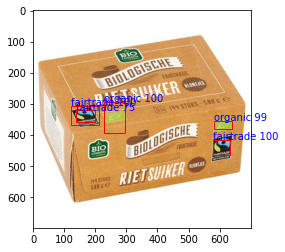

------------------------------------------------------
beterleven365.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


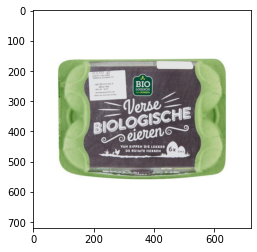

------------------------------------------------------
c935b6ebed349a3838b666650a6f989f.jpg
True certificates: ['fairtrade', 'organic']
Prediction (+ certainty)
fairtrade : 100 %
organic : 100 %
fairtrade : 98 %
fairtrade : 89 %


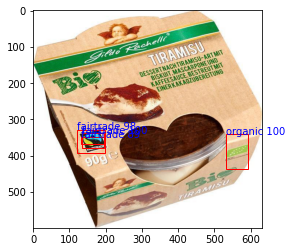

------------------------------------------------------
beterleven332.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 100 %


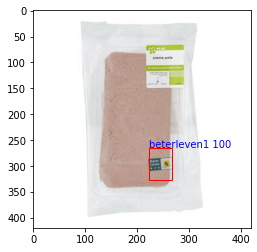

------------------------------------------------------
asc15.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 100 %


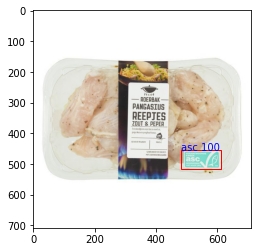

------------------------------------------------------
rfalliance37.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


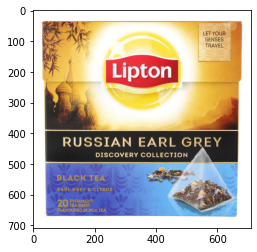

------------------------------------------------------
demeter85.jpg
True certificates: ['demeter']
Prediction (+ certainty)
demeter : 100 %


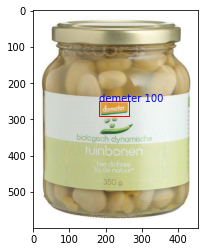

------------------------------------------------------
c11dbc4a6ad859750c9abd890835b3f5.jpg
True certificates: ['organic']
Geen keurmerk gescout!
Prediction (+ certainty)


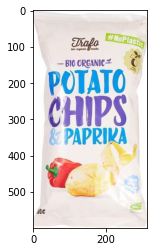

------------------------------------------------------
e5af4e5abff1c6545552d5b1869d251b.jpg
True certificates: ['bio']
Prediction (+ certainty)
bio : 100 %


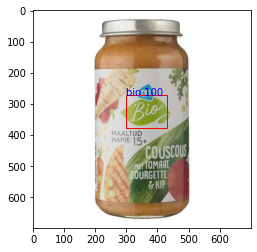

------------------------------------------------------
demeter97.jpg
True certificates: ['demeter', 'organic']
Prediction (+ certainty)
demeter : 100 %
organic : 85 %


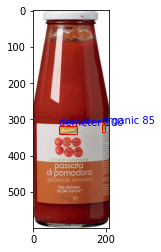

------------------------------------------------------
asc9.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 100 %


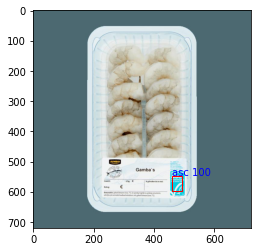

------------------------------------------------------
rfalliance66.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


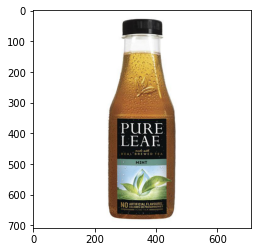

------------------------------------------------------
beterleven150.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 100 %


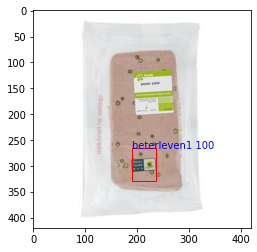

------------------------------------------------------
0b7e4037390ddd785dee487599725954.jpg
True certificates: ['organic', 'vegan']
Prediction (+ certainty)
organic : 97 %


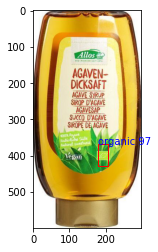

------------------------------------------------------
eko89.jpg
True certificates: ['eko']
Geen keurmerk gescout!
Prediction (+ certainty)


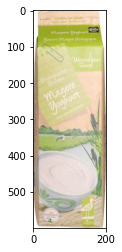

------------------------------------------------------
demeter24.jpg
True certificates: ['organic', 'eko', 'demeter']
Prediction (+ certainty)
organic : 100 %
demeter : 96 %
eko : 78 %


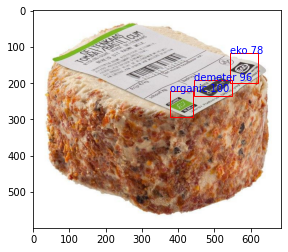

------------------------------------------------------
b422d16525c0318af00bc0fe22641dd3.jpg
True certificates: ['bio']
Prediction (+ certainty)
bio : 100 %


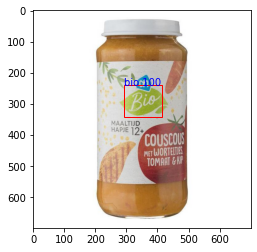

------------------------------------------------------
ea9e68712135a9603613fced2981370d.jpg
True certificates: ['vegan', 'organic']
Prediction (+ certainty)
organic : 100 %
vegan : 100 %


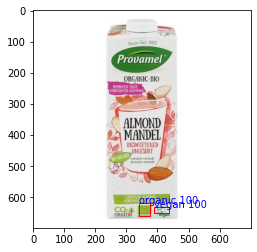

------------------------------------------------------
msc81.jpg
True certificates: ['msc']
Prediction (+ certainty)
msc : 79 %


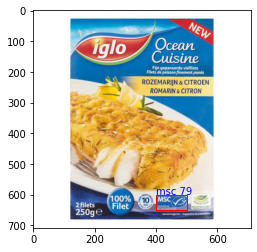

------------------------------------------------------
8979c69ebff4651f7a7d0a5b76932a51.jpg
True certificates: ['weidemelk']
Prediction (+ certainty)
weidemelk : 100 %
weidemelk : 100 %


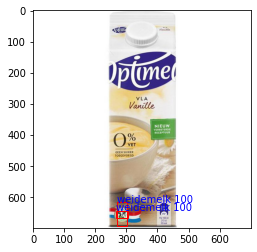

------------------------------------------------------
msc14.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


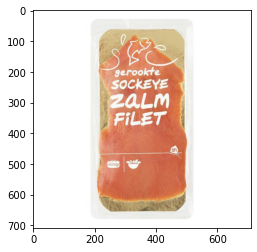

------------------------------------------------------
beterleven127.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven2 : 98 %


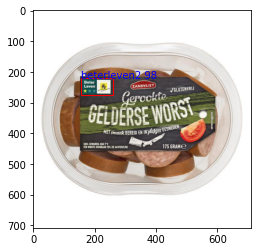

------------------------------------------------------
2491319b88e3c2fd780a7fcbec30eb17.jpg
True certificates: ['fairtrade']
Prediction (+ certainty)
fairtrade : 100 %
fairtrade : 97 %


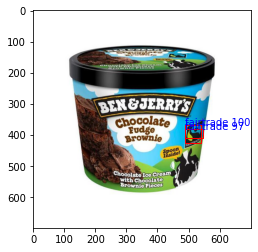

------------------------------------------------------
demeter40.jpg
True certificates: ['demeter']
Prediction (+ certainty)
demeter : 100 %


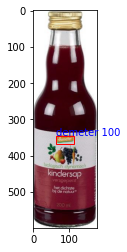

------------------------------------------------------
demeter102.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


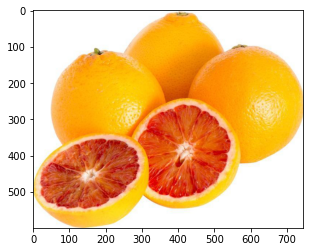

------------------------------------------------------
beterleven23.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 96 %
beterleven2 : 74 %


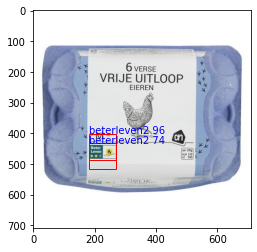

------------------------------------------------------
msc64.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


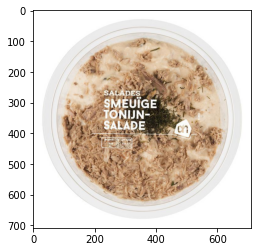

------------------------------------------------------
beterleven195.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 99 %


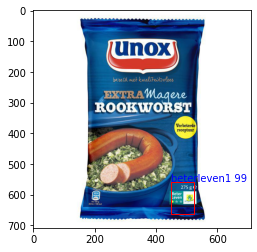

------------------------------------------------------
beb20c1813840d41129f282ac31c95c0.jpg
True certificates: ['fairtrade', 'organic']
Prediction (+ certainty)
fairtrade : 100 %
fairtrade : 100 %
organic : 97 %


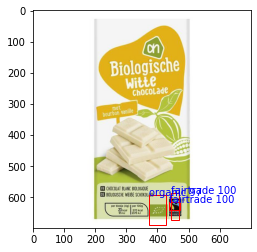

------------------------------------------------------
47929d26f76c386e6aa9c2be84a94c20.jpg
True certificates: ['organic', 'vegan']
Prediction (+ certainty)
organic : 98 %
utz : 96 %
organic : 88 %


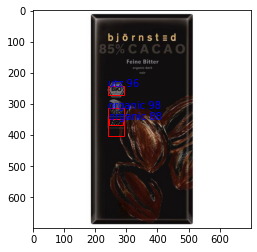

------------------------------------------------------
asc52.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 100 %
asc : 100 %


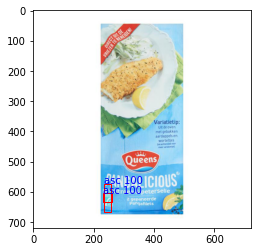

------------------------------------------------------
beterleven173.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


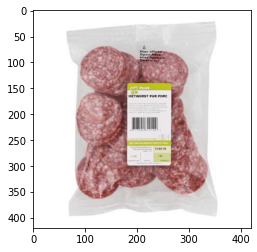

------------------------------------------------------
asc56.jpg
True certificates: ['asc', 'asc']
Prediction (+ certainty)
asc : 99 %
organic : 99 %
asc : 96 %


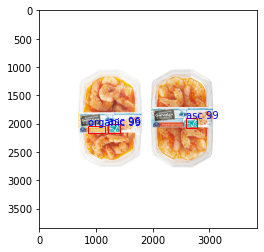

------------------------------------------------------
d8d2d8795d9e1ecfeed89357a0903a1d.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 99 %


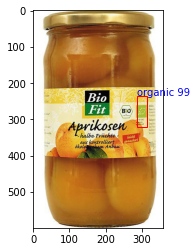

------------------------------------------------------
asc84.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 100 %


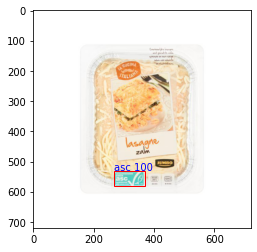

------------------------------------------------------
beterleven147.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


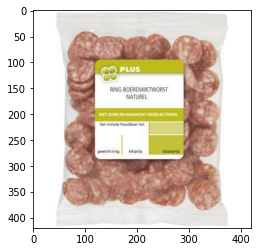

------------------------------------------------------
e29c34bbfc4a7675b4f70b5f1aa2c40d.jpg
True certificates: ['vegan']
Geen keurmerk gescout!
Prediction (+ certainty)


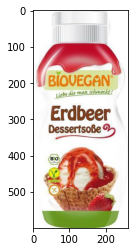

------------------------------------------------------
msc39.jpg
True certificates: ['msc']
Prediction (+ certainty)
msc : 100 %
msc : 95 %


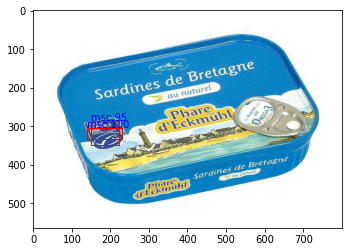

------------------------------------------------------
8397a8abe06449224037ac6afdd8c297.jpg
True certificates: ['planetproof']
Prediction (+ certainty)
planetproof : 100 %
planetproof : 90 %


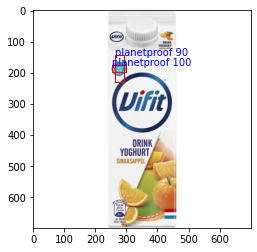

------------------------------------------------------
e3dc566a804a2196fa97b4c2a9bb720a.jpg
True certificates: ['planetproof', 'weidemelk']
Prediction (+ certainty)
weidemelk : 100 %
planetproof : 100 %
weidemelk : 100 %
planetproof : 88 %


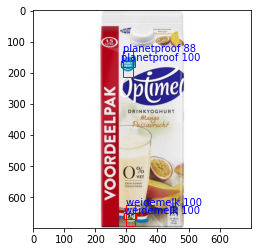

------------------------------------------------------
beterleven157.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 100 %


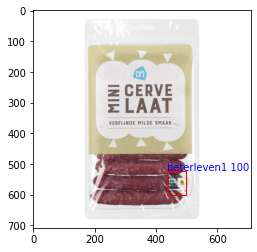

------------------------------------------------------
cbe6e8caa1a81765c3071767311e309d.jpg
True certificates: ['fairtrade']
Prediction (+ certainty)
fairtrade : 100 %


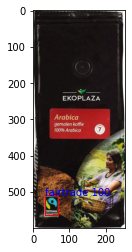

------------------------------------------------------
rfalliance29.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


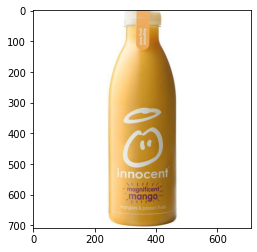

------------------------------------------------------
beterleven394.jpg
True certificates: ['organic', 'beterleven3', 'eko']
Prediction (+ certainty)
beterleven3 : 100 %
organic : 100 %
eko : 100 %
eko : 97 %


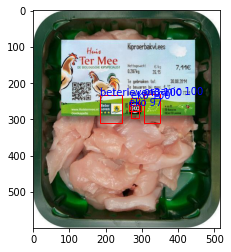

------------------------------------------------------
beterleven139.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 99 %


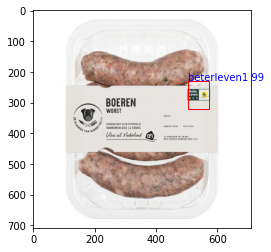

------------------------------------------------------
beterleven162.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 98 %


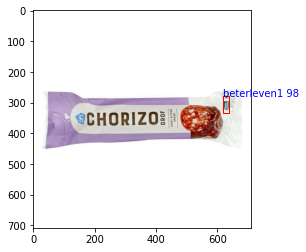

------------------------------------------------------
beterleven263.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 100 %


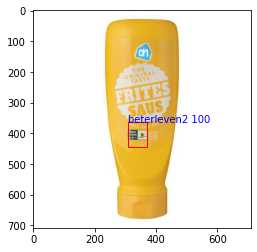

------------------------------------------------------
f93192abf019762ef57a8ee650746601.jpg
True certificates: ['planetproof']
Prediction (+ certainty)
planetproof : 100 %


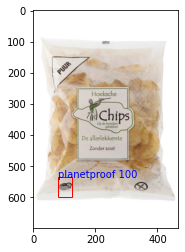

------------------------------------------------------
asc49.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 98 %


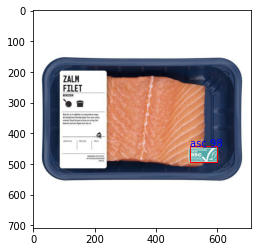

------------------------------------------------------
beterleven213.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 98 %


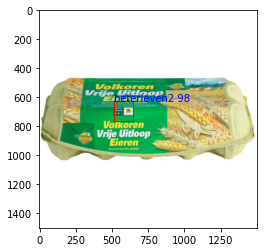

------------------------------------------------------
beterleven241.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 100 %


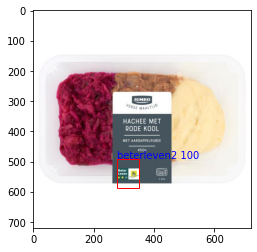

------------------------------------------------------
775c7600366689df625a32d243b5c3db.jpg
True certificates: ['planetproof']
Prediction (+ certainty)
planetproof : 100 %


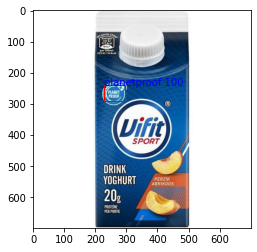

------------------------------------------------------
asc33.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 100 %
asc : 98 %


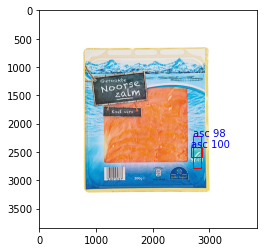

------------------------------------------------------
6c576f7321fc919b1f7608a69aecc4e4.jpg
True certificates: ['weidemelk']
Prediction (+ certainty)
weidemelk : 100 %
weidemelk : 100 %


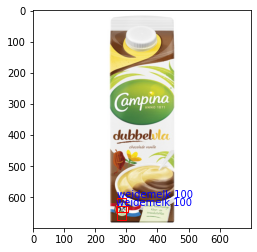

------------------------------------------------------
beterleven166.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven2 : 100 %


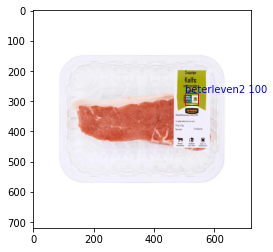

------------------------------------------------------
beterleven272.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 100 %


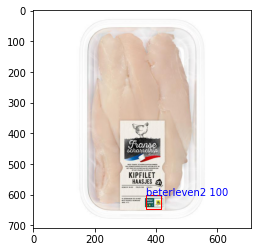

------------------------------------------------------
b24429b6f5ed95f69cdcc26d6b807316.jpg
True certificates: ['organic', 'vegan']
Prediction (+ certainty)
organic : 100 %


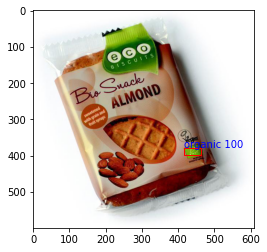

------------------------------------------------------
7e3a0a41fe74e63811b222a25502178a.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 98 %


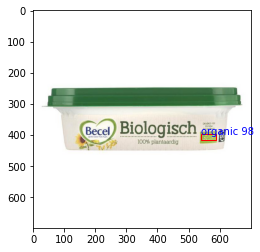

------------------------------------------------------
msc35.jpg
True certificates: ['msc']
Prediction (+ certainty)
msc : 100 %


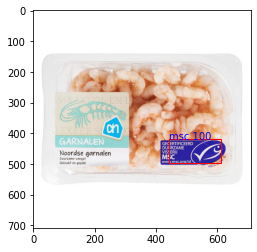

------------------------------------------------------
9f19c7929cbd52eb87144c595318c4f3.jpg
True certificates: ['eko']
Prediction (+ certainty)
eko : 100 %
organic : 100 %
beterleven2 : 99 %


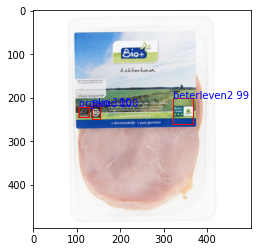

------------------------------------------------------
beterleven324.jpg
True certificates: ['beterleven3']
Prediction (+ certainty)
beterleven3 : 100 %


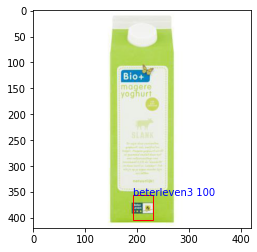

------------------------------------------------------
4aa240e9907af1a5b67320ea49027035.jpg
True certificates: ['fairtrade']
Prediction (+ certainty)
fairtrade : 100 %


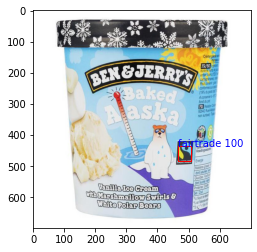

------------------------------------------------------
planetproof40.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


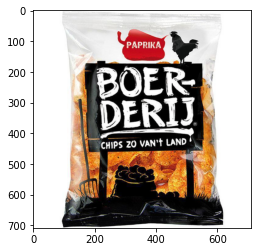

------------------------------------------------------
3e336cced9e9c5e4a9d08c84487b5a1e.jpg
True certificates: ['bio']
Prediction (+ certainty)
bio : 100 %


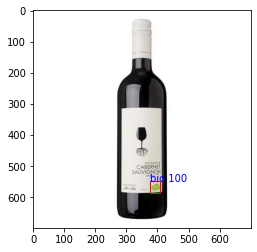

------------------------------------------------------
009e35498ba0f481abef283dc864610e.jpg
True certificates: ['fairtrade']
Prediction (+ certainty)
fairtrade : 100 %
fairtrade : 99 %


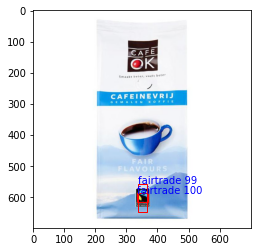

------------------------------------------------------
475ff2e989ee304427f5e7b4ad508782.jpg
True certificates: ['eko']
Prediction (+ certainty)
organic : 100 %


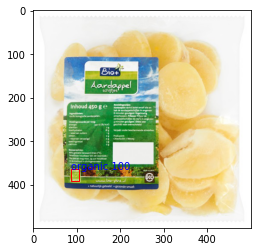

------------------------------------------------------
c320cf027c652e1d5515a44ffe77042c.jpg
True certificates: ['organic']
Prediction (+ certainty)
beterleven1 : 99 %
organic : 99 %


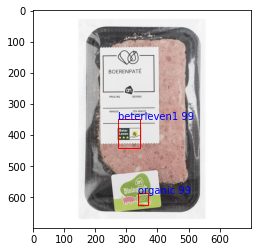

------------------------------------------------------
eko93.jpg
True certificates: ['eko', 'organic']
Prediction (+ certainty)
organic : 100 %


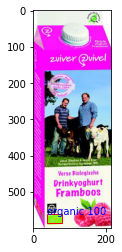

------------------------------------------------------
beterleven234.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 93 %


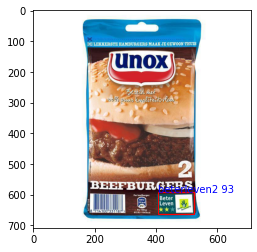

------------------------------------------------------
11be9d213dc9247b98f0f2253f7f53c7.jpg
True certificates: ['weidemelk']
Prediction (+ certainty)
weidemelk : 100 %
weidemelk : 100 %


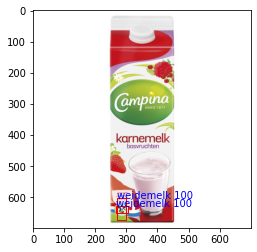

------------------------------------------------------
36610aa77f07d3c250d7c11c16bc781a.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 100 %
vegan : 100 %
vegan : 98 %


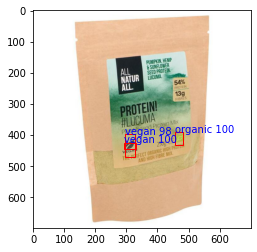

------------------------------------------------------
beterleven182.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 94 %
beterleven1 : 93 %


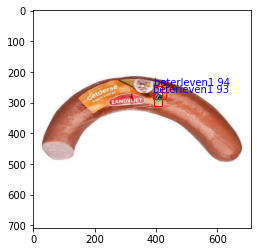

------------------------------------------------------
demeter84.jpg
True certificates: ['demeter']
Prediction (+ certainty)
demeter : 100 %


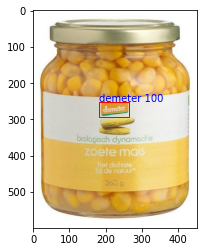

------------------------------------------------------
demeter1.jpg
True certificates: ['demeter', 'eko']
Prediction (+ certainty)
demeter : 100 %


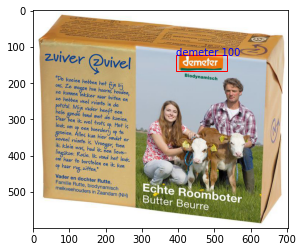

------------------------------------------------------
89214ed1f93513a9cbe5c043e0779746.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 100 %


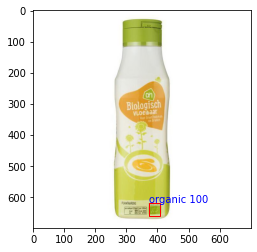

------------------------------------------------------
beterleven279.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


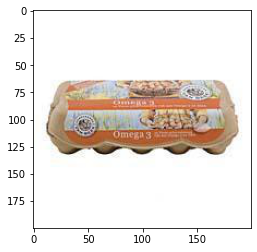

------------------------------------------------------
asc72.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 100 %


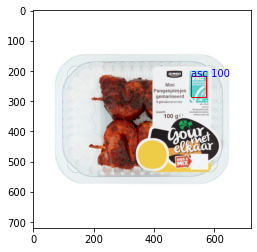

------------------------------------------------------
92a964a2bf8f987ab4a7f86c8451b537.jpg
True certificates: ['organic', 'vegan']
Prediction (+ certainty)
organic : 100 %
vegan : 98 %


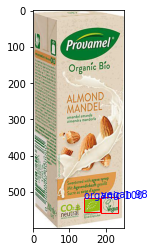

------------------------------------------------------
demeter5.jpg
True certificates: ['demeter']
Prediction (+ certainty)
demeter : 100 %


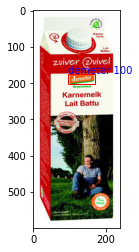

------------------------------------------------------
rfalliance67.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


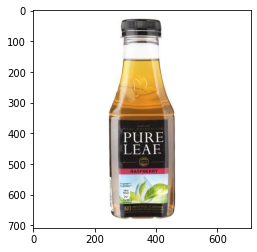

------------------------------------------------------
planetproof24.jpg
True certificates: ['weidemelk']
Prediction (+ certainty)
weidemelk : 100 %
weidemelk : 93 %


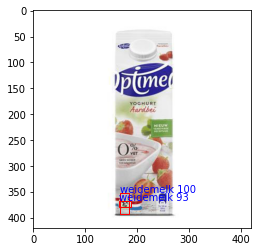

------------------------------------------------------
35498e8fc4dfdc555989975576775b6c.jpg
True certificates: ['fairtrade', 'vegan']
Prediction (+ certainty)
fairtrade : 100 %
fairtrade : 94 %
fairtrade : 92 %


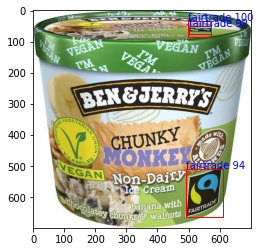

------------------------------------------------------
beterleven268.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 99 %


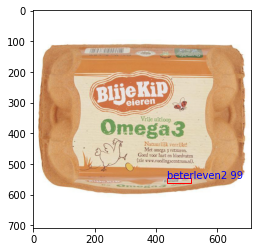

------------------------------------------------------
ad8a8e719da21e7904c295e9a72feaeb.jpg
True certificates: ['weidemelk']
Prediction (+ certainty)
weidemelk : 100 %
weidemelk : 91 %


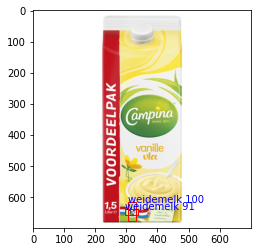

------------------------------------------------------
b87ad5147bc86c32f9dc9d3d8a048dad.jpg
True certificates: ['fairtrade']
Prediction (+ certainty)
fairtrade : 100 %
fairtrade : 100 %


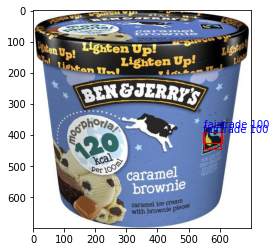

------------------------------------------------------
beterleven223.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


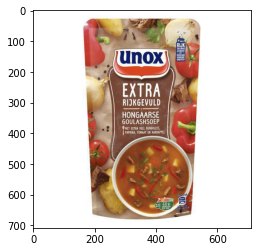

------------------------------------------------------
beterleven194.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 100 %


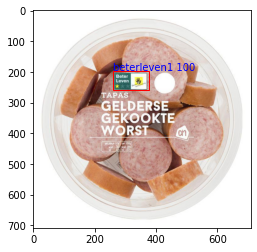

------------------------------------------------------
beterleven15.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 100 %


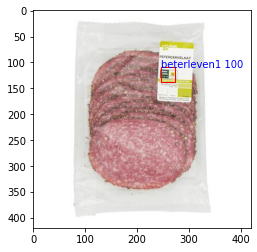

------------------------------------------------------
rfalliance65.jpg
True certificates: ['rfalliance', 'rfalliance', 'rfalliance']
Prediction (+ certainty)
rfalliance : 100 %
rfalliance : 100 %
rfalliance : 100 %


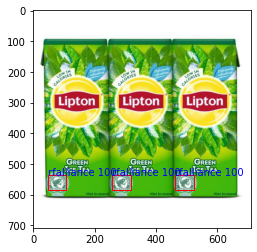

------------------------------------------------------
f6d9c67fdc69f7999b151a89de2c0b2e.jpg
True certificates: ['utz']
Prediction (+ certainty)
utz : 95 %


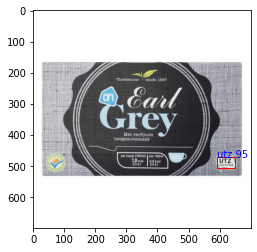

------------------------------------------------------
msc19.jpg
True certificates: ['msc']
Prediction (+ certainty)
msc : 95 %


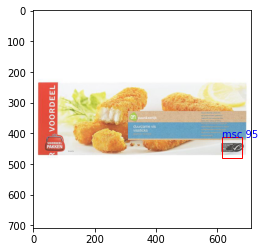

------------------------------------------------------
beterleven131.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 100 %


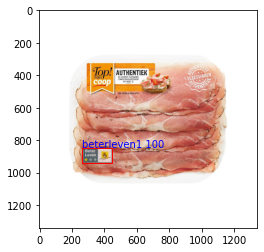

------------------------------------------------------
beterleven132.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


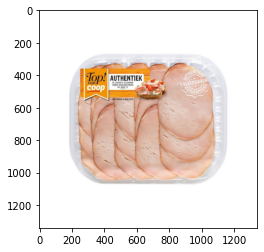

------------------------------------------------------
ff59751614a24ff7bc43f67da516ffe5.jpg
True certificates: ['eko']
Prediction (+ certainty)
fairtrade : 81 %


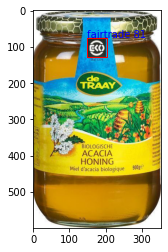

------------------------------------------------------
msc55.jpg
True certificates: ['msc']
Prediction (+ certainty)
msc : 100 %
msc : 100 %


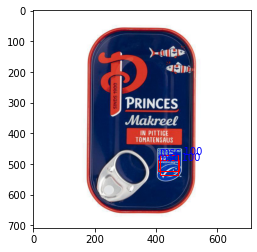

------------------------------------------------------
beterleven134.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


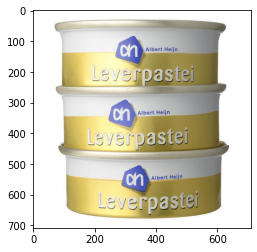

------------------------------------------------------
beterleven112.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 100 %


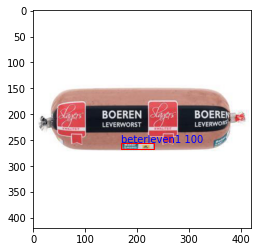

------------------------------------------------------
msc51.jpg
True certificates: ['msc']
Prediction (+ certainty)
msc : 100 %
msc : 98 %


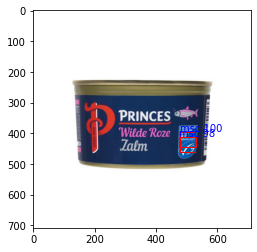

------------------------------------------------------
fc9179c863080265c0d92c26874fcb9c.jpg
True certificates: ['fairtrade', 'vegan']
Prediction (+ certainty)
fairtrade : 99 %
vegan : 99 %
vegan : 95 %


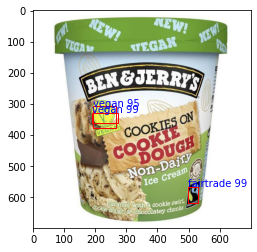

------------------------------------------------------
msc77.jpg
True certificates: ['msc']
Prediction (+ certainty)
msc : 100 %


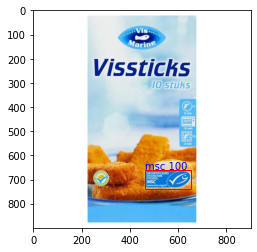

------------------------------------------------------
beterleven233.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 100 %


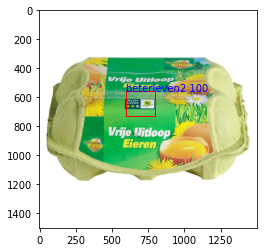

------------------------------------------------------
asc82.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


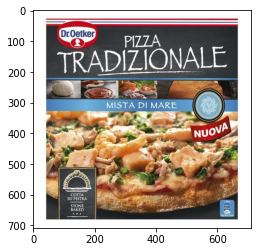

------------------------------------------------------
486b235c98becf209159cfc8e551e2f0.jpg
True certificates: ['fairtrade']
Prediction (+ certainty)
fairtrade : 100 %
fairtrade : 97 %


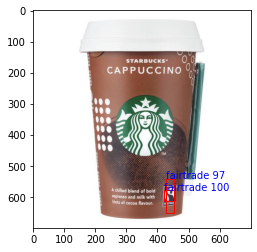

------------------------------------------------------
701ed0a5700d726ab8de72a19cf909e1.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 100 %
organic : 86 %


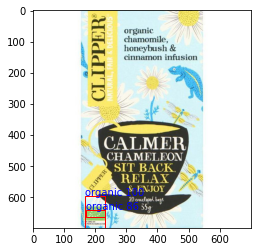

------------------------------------------------------
beterleven141.jpg
True certificates: ['beterleven1']
Geen keurmerk gescout!
Prediction (+ certainty)


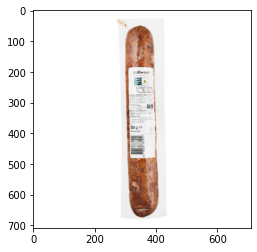

------------------------------------------------------
d7707ff9d724ef63310da42cf6293a4c.jpg
True certificates: ['planetproof', 'weidemelk']
Prediction (+ certainty)
planetproof : 100 %
weidemelk : 100 %


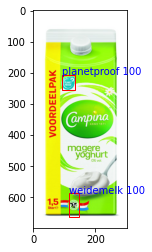

------------------------------------------------------
aeef3b1f9528c0fa0d1d7d891ac66881.jpg
True certificates: ['fairtrade']
Prediction (+ certainty)
fairtrade : 100 %


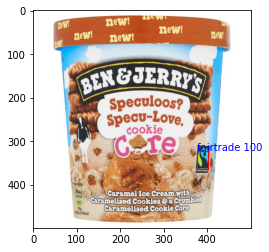

------------------------------------------------------
00b107b8f544b969ef1415542a8bca00.jpg
True certificates: ['fairtrade', 'organic']
Prediction (+ certainty)
organic : 100 %
fairtrade : 100 %
fairtrade : 96 %


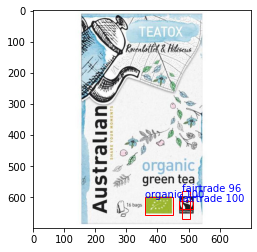

------------------------------------------------------
rfalliance93.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


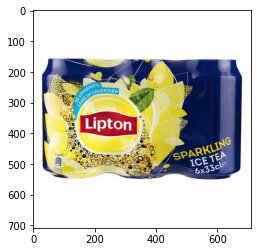

------------------------------------------------------
c262fa28d2a1eb232214b5f1edd3f2e9.jpg
True certificates: ['organic', 'organic']
Prediction (+ certainty)
organic : 100 %
organic : 100 %


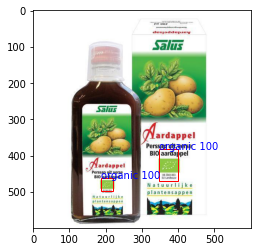

------------------------------------------------------
b7fd72c9037d2fb657c72b2998f29c2a.jpg
True certificates: ['fairtrade', 'vegan']
Prediction (+ certainty)
fairtrade : 100 %


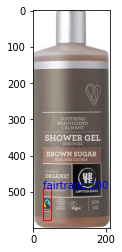

------------------------------------------------------
beterleven260.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


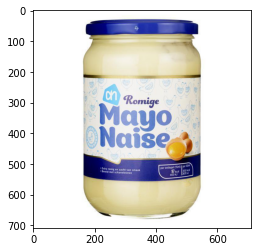

------------------------------------------------------
beterleven186.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 99 %
beterleven1 : 99 %


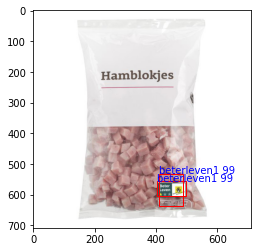

------------------------------------------------------
rfalliance43.jpg
True certificates: ['rfalliance', 'rfalliance']
Prediction (+ certainty)
rfalliance : 99 %


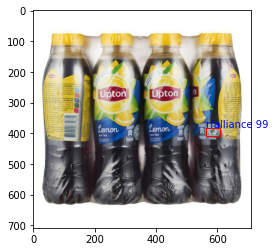

------------------------------------------------------
asc90.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


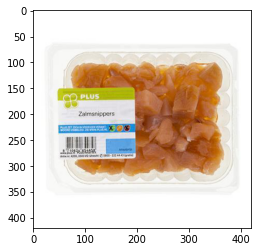

------------------------------------------------------
beterleven25.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


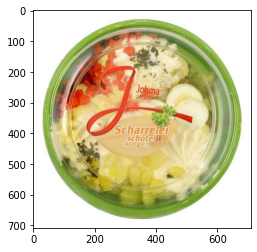

------------------------------------------------------
3d662b7c097ba0d47d995839418748f9.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 100 %
organic : 93 %


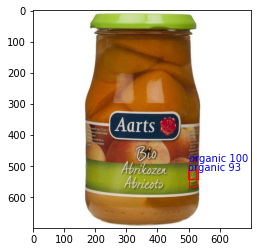

------------------------------------------------------
4cfddb8a530f11936cd43ea36077ee32.jpg
True certificates: ['planetproof', 'weidemelk']
Prediction (+ certainty)
weidemelk : 100 %
planetproof : 100 %
weidemelk : 100 %
planetproof : 90 %


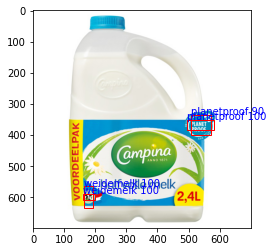

------------------------------------------------------
msc90.jpg
True certificates: ['msc']
Prediction (+ certainty)
msc : 100 %


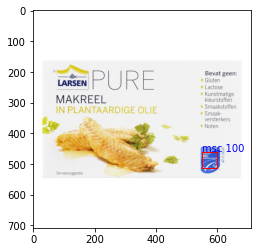

------------------------------------------------------
beterleven165.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven2 : 100 %


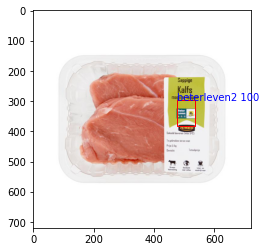

------------------------------------------------------
0bb2f5b044e4049354060e6b0b8e8952.jpg
True certificates: ['utz']
Prediction (+ certainty)
utz : 100 %
utz : 80 %


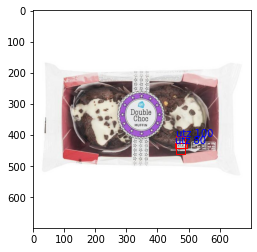

------------------------------------------------------
d9d90f902202408b7289aa8e59f107c5.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 100 %


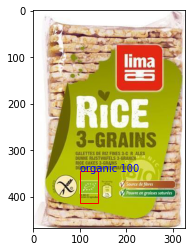

------------------------------------------------------
msc15.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


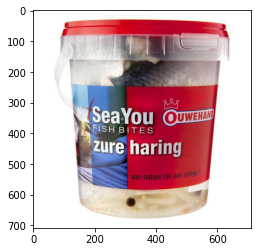

------------------------------------------------------
msc28.jpg
True certificates: ['msc']
Prediction (+ certainty)
msc : 100 %
msc : 100 %


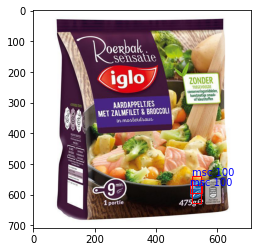

------------------------------------------------------
beterleven369.jpg
True certificates: ['beterleven3']
Prediction (+ certainty)
bio : 100 %
beterleven3 : 89 %


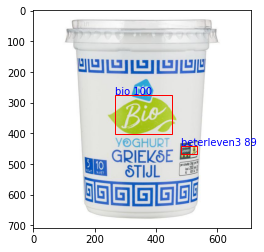

------------------------------------------------------
0a6be6a867059fefee8e37e852bb9e05.jpg
True certificates: ['bio']
Prediction (+ certainty)
bio : 99 %


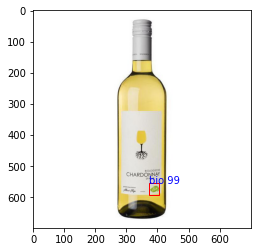

------------------------------------------------------
90aee1c018f9580a5a1844c0afd49ca0.jpg
True certificates: ['bio']
Prediction (+ certainty)
bio : 100 %


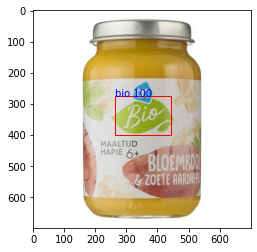

------------------------------------------------------
rfalliance82.jpg
True certificates: ['rfalliance']
Prediction (+ certainty)
rfalliance : 100 %


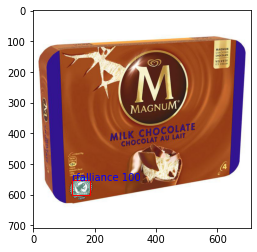

------------------------------------------------------
planetproof42.jpg
True certificates: ['planetproof', 'weidemelk']
Prediction (+ certainty)
weidemelk : 100 %
planetproof : 100 %
planetproof : 96 %
weidemelk : 89 %


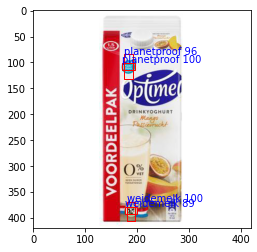

------------------------------------------------------
rfalliance53.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


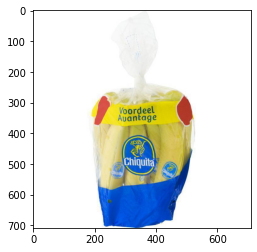

------------------------------------------------------
40c730063a27b64b2bcdf539c90c510f.jpg
True certificates: ['utz']
Prediction (+ certainty)
utz : 100 %


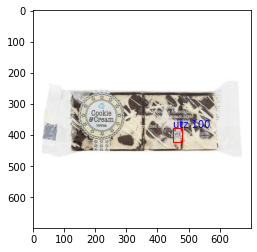

------------------------------------------------------
rfalliance3.jpg
True certificates: ['rfalliance']
Prediction (+ certainty)
rfalliance : 100 %


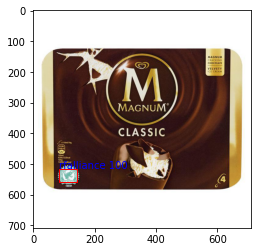

------------------------------------------------------
beterleven216.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 100 %


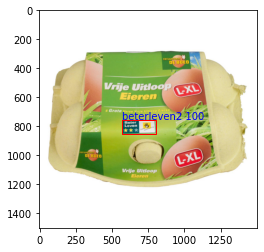

------------------------------------------------------
1b79f74b9a2015fe75f90a0dc98c3354.jpg
True certificates: ['fairtrade', 'eko']
Prediction (+ certainty)
fairtrade : 100 %
utz : 100 %
fairtrade : 100 %


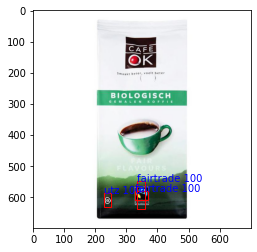

------------------------------------------------------
organic227.jpg
True certificates: ['organic', 'vegan']
Prediction (+ certainty)
demeter : 98 %


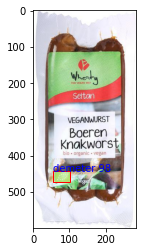

------------------------------------------------------
demeter76.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


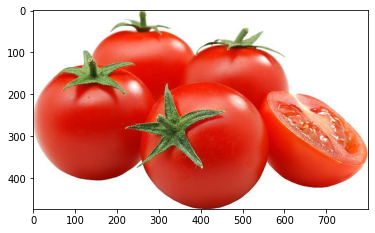

------------------------------------------------------
beterleven357.jpg
True certificates: ['beterleven3']
Prediction (+ certainty)
beterleven3 : 100 %


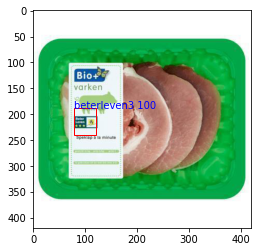

------------------------------------------------------
demeter81.jpg
True certificates: ['demeter']
Prediction (+ certainty)
demeter : 100 %


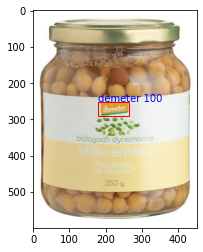

------------------------------------------------------
asc68.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 100 %
asc : 100 %


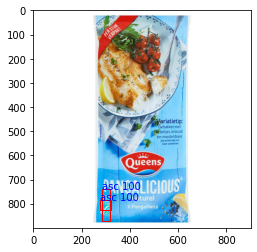

------------------------------------------------------
beterleven251.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven3 : 100 %


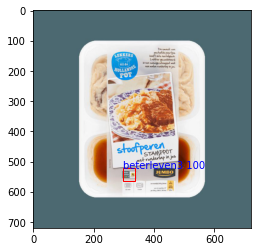

------------------------------------------------------
e410ce1c9b2ee0e1e54e740bbf1b9b6a.jpg
True certificates: ['bio']
Prediction (+ certainty)
bio : 100 %
bio : 99 %


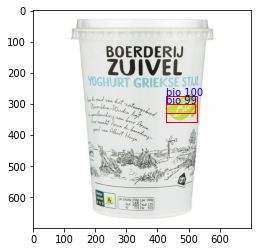

------------------------------------------------------
beterleven133.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


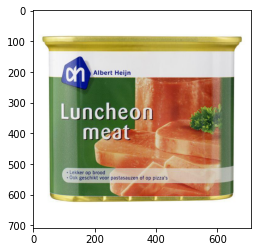

------------------------------------------------------
asc14.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 100 %


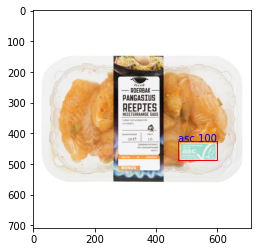

------------------------------------------------------
d985343bd0d39a195193c64531817557.jpg
True certificates: ['fairtrade', 'fairtrade']
Prediction (+ certainty)
fairtrade : 100 %


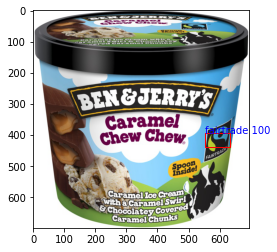

------------------------------------------------------
msc5.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


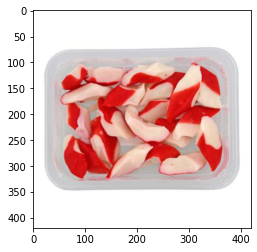

------------------------------------------------------
demeter27.jpg
True certificates: ['demeter', 'demeter', 'organic', 'eko']
Prediction (+ certainty)
demeter : 100 %
organic : 100 %
eko : 100 %
demeter : 100 %
demeter : 100 %
demeter : 93 %
demeter : 85 %


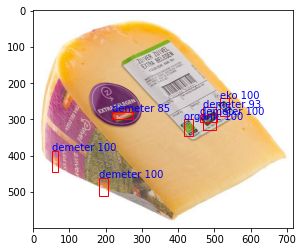

------------------------------------------------------
beterleven226.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 100 %


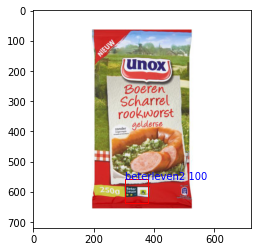

------------------------------------------------------
rfalliance19.jpg
True certificates: ['rfalliance']
Prediction (+ certainty)
rfalliance : 100 %
rfalliance : 91 %


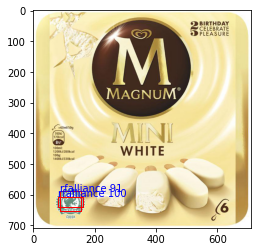

------------------------------------------------------
beterleven222.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 100 %
beterleven2 : 91 %


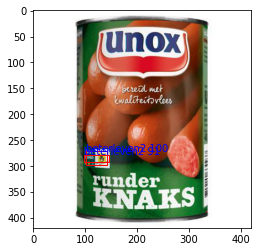

------------------------------------------------------
beterleven152.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 100 %


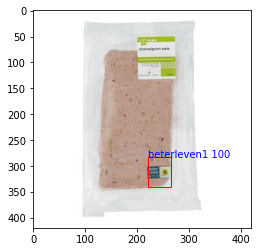

------------------------------------------------------
msc52.jpg
True certificates: ['msc']
Prediction (+ certainty)
msc : 100 %


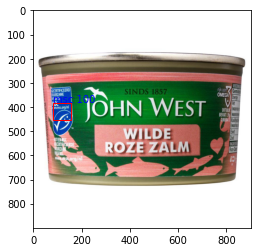

------------------------------------------------------
msc54.jpg
True certificates: ['msc']
Prediction (+ certainty)
msc : 100 %
msc : 85 %


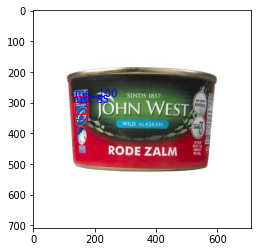

------------------------------------------------------
dab1a6244890daa4572dfe16d6cc598e.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 93 %


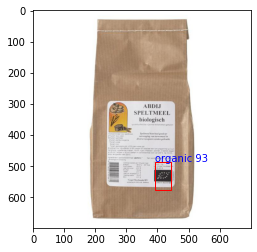

------------------------------------------------------
798c05e0546ebdbd639318012366c12a.jpg
True certificates: ['fairtrade', 'fairtrade']
Prediction (+ certainty)
fairtrade : 100 %


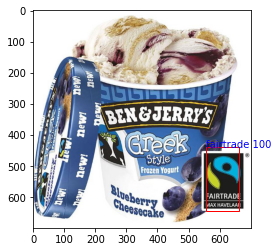

------------------------------------------------------
d2f52937217d05b65a0199ee59a9de0d.jpg
True certificates: ['fairtrade']
Prediction (+ certainty)
fairtrade : 100 %
fairtrade : 100 %


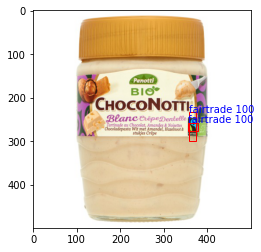

------------------------------------------------------
bd03022c242468afe22e93d123199730.jpg
True certificates: ['bio']
Prediction (+ certainty)
bio : 99 %


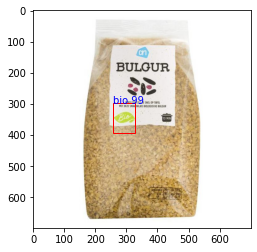

------------------------------------------------------
beterleven266.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 100 %


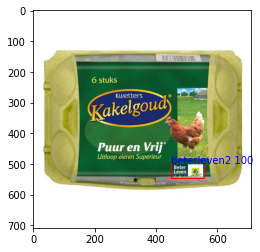

------------------------------------------------------
ff0f0a84eaf481a7f17c92a8259233c6.jpg
True certificates: ['eko']
Geen keurmerk gescout!
Prediction (+ certainty)


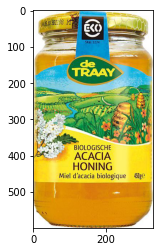

------------------------------------------------------
beterleven151.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven1 : 100 %


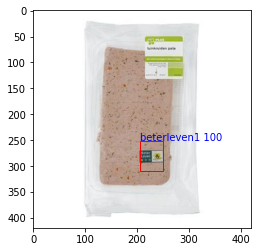

------------------------------------------------------
msc9.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


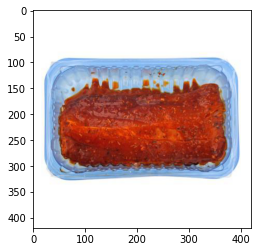

------------------------------------------------------
demeter8.jpg
True certificates: ['eko', 'demeter']
Prediction (+ certainty)
demeter : 100 %
eko : 99 %
eko : 88 %


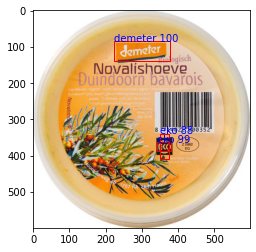

------------------------------------------------------
beterleven341.jpg
True certificates: ['beterleven3', 'bio']
Prediction (+ certainty)
beterleven3 : 98 %
bio : 95 %


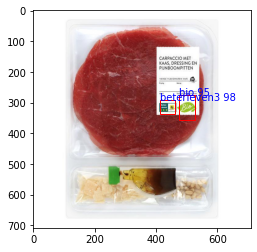

------------------------------------------------------
beterleven119.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven2 : 97 %


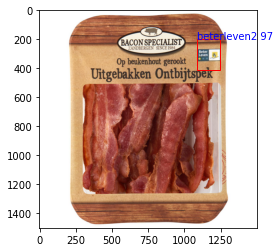

------------------------------------------------------
ab3ff0c80a6b3ea4b742ff94fb83e56f.jpg
True certificates: ['fairtrade']
Prediction (+ certainty)
fairtrade : 100 %


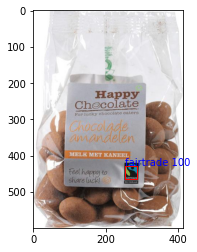

------------------------------------------------------
c023da2cf892a8b91e0de1459947b952.jpg
True certificates: ['bio', 'organic', 'eko']
Prediction (+ certainty)
organic : 100 %
eko : 100 %


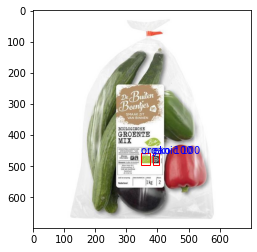

------------------------------------------------------
beterleven388.jpg
True certificates: ['organic', 'beterleven3']
Prediction (+ certainty)
beterleven3 : 100 %
organic : 100 %


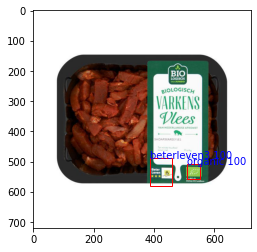

------------------------------------------------------
a50185334e12d26f8d40eadac4b92d6f.jpg
True certificates: ['utz']
Prediction (+ certainty)
utz : 100 %
utz : 93 %


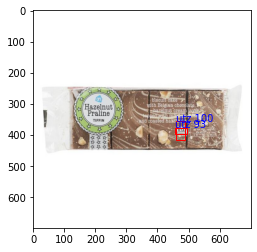

------------------------------------------------------
74aabd562cbd7d15d00f3ae4f05e0a37.jpg
True certificates: ['bio']
Prediction (+ certainty)
bio : 100 %


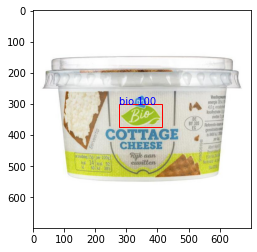

------------------------------------------------------
rfalliance49.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


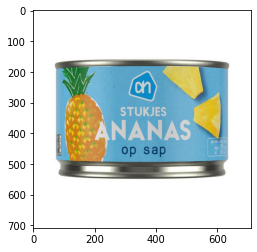

------------------------------------------------------
planetproof21.jpg
True certificates: ['weidemelk']
Prediction (+ certainty)
weidemelk : 100 %
weidemelk : 100 %


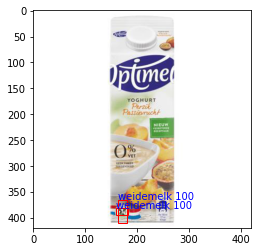

------------------------------------------------------
61cac2fc06018e7012c7364adc3b7316.jpg
True certificates: ['bio']
Prediction (+ certainty)
bio : 100 %


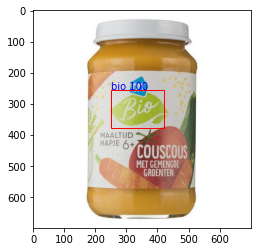

------------------------------------------------------
demeter57.jpg
True certificates: ['demeter']
Prediction (+ certainty)
demeter : 100 %


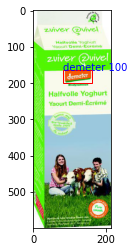

------------------------------------------------------
eko91.jpg
True certificates: ['eko']
Prediction (+ certainty)
eko : 100 %


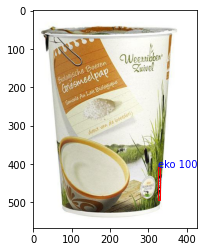

------------------------------------------------------
beterleven254.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 100 %


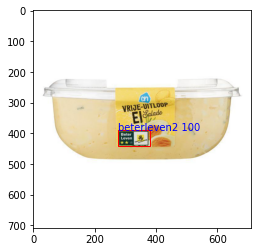

------------------------------------------------------
4055e100dfcddfa94ebe024daf2014f6.jpg
True certificates: ['utz']
Prediction (+ certainty)
utz : 100 %
utz : 100 %


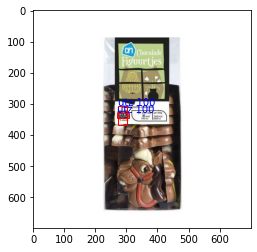

------------------------------------------------------
3123d0c83c21b0ca2931504972c8121a.jpg
True certificates: ['fairtrade', 'bio']
Prediction (+ certainty)
fairtrade : 100 %
bio : 100 %


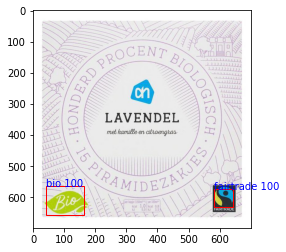

------------------------------------------------------
msc71.jpg
True certificates: ['msc']
Prediction (+ certainty)
msc : 100 %


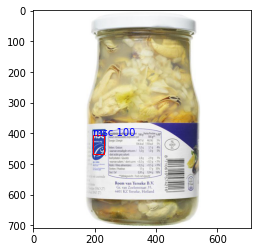

------------------------------------------------------
beterleven12.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


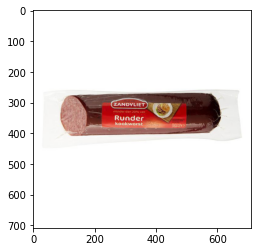

------------------------------------------------------
beterleven255.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


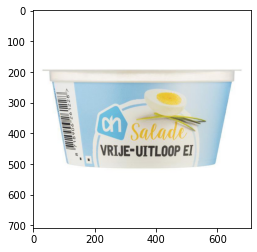

------------------------------------------------------
d9512b0e84c99934566bed2eb3486745.jpg
True certificates: ['utz']
Prediction (+ certainty)
utz : 100 %


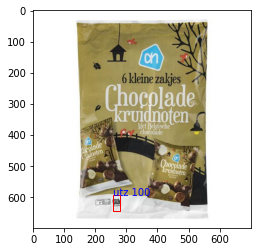

------------------------------------------------------
67a628158dc49527e931c87ed102730c.jpg
True certificates: ['fairtrade']
Prediction (+ certainty)
fairtrade : 100 %


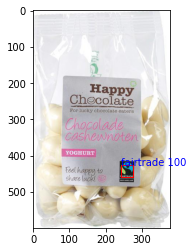

------------------------------------------------------
demeter59.jpg
True certificates: ['demeter']
Prediction (+ certainty)
demeter : 100 %


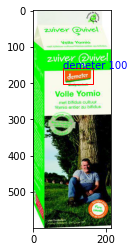

------------------------------------------------------
demeter54.jpg
True certificates: ['demeter']
Prediction (+ certainty)
demeter : 100 %


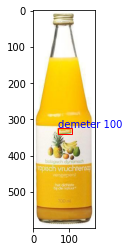

------------------------------------------------------
5ccbc4957503de9d53a317653fc24ae2.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 100 %


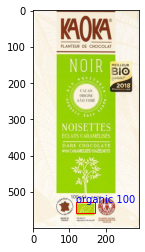

------------------------------------------------------
79b571c1ec200eeaf16052997e7cddfc.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 96 %
organic : 81 %
organic : 78 %


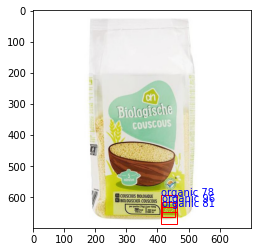

------------------------------------------------------
msc4.jpg
True certificates: []
Geen keurmerk gescout!
Prediction (+ certainty)


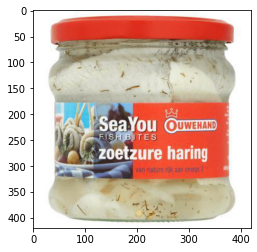

------------------------------------------------------
5b38cfd887c5c4efa7a76ab2a4d70bba.jpg
True certificates: ['bio']
Prediction (+ certainty)
bio : 99 %


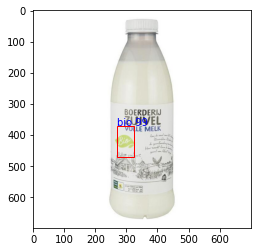

------------------------------------------------------
8a27b9fb6ccd2d55be325501eef43447.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 100 %


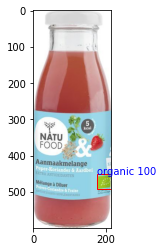

------------------------------------------------------
rfalliance10.jpg
True certificates: ['rfalliance']
Prediction (+ certainty)
rfalliance : 100 %
rfalliance : 98 %


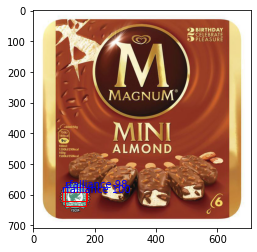

------------------------------------------------------
8731cd35359dc10fd185884666633045.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 100 %


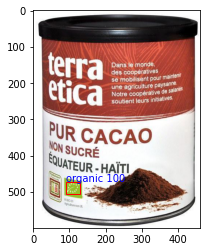

------------------------------------------------------
asc36.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 100 %


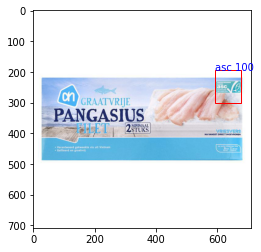

------------------------------------------------------
beterleven299.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 100 %


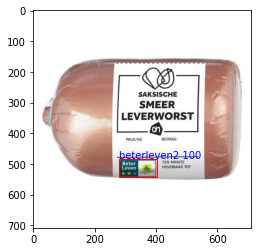

------------------------------------------------------
b570c308395294d579221989fd98fb7f.jpg
True certificates: ['utz']
Prediction (+ certainty)
utz : 100 %


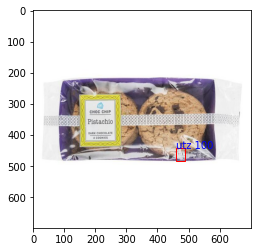

------------------------------------------------------
eko80.jpg
True certificates: ['eko', 'organic']
Prediction (+ certainty)
organic : 100 %
eko : 94 %


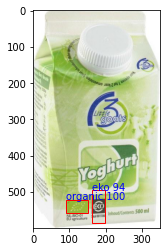

------------------------------------------------------
784678f673afa5b9c57d0a894f4287ae.jpg
True certificates: ['organic', 'eko']
Prediction (+ certainty)
organic : 99 %
eko : 86 %
eko : 74 %


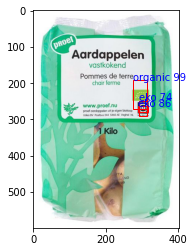

------------------------------------------------------
asc73.jpg
True certificates: ['asc']
Prediction (+ certainty)
asc : 100 %


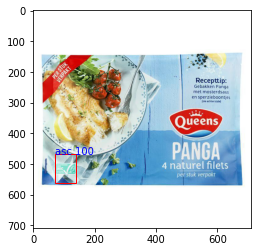

------------------------------------------------------
beterleven10.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven2 : 100 %


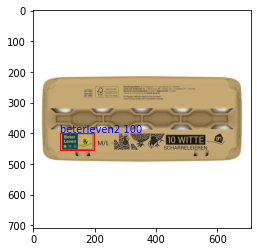

------------------------------------------------------
beterleven190.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven2 : 98 %


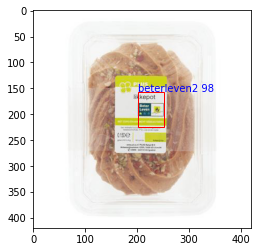

------------------------------------------------------
8e93816cf94ec6441418d0d45f822b68.jpg
True certificates: ['organic']
Prediction (+ certainty)
organic : 100 %
organic : 91 %


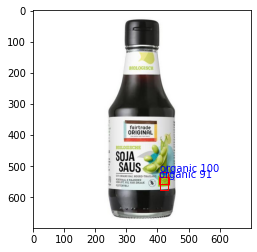

------------------------------------------------------
03eb812f826003b1ae6d49655200b936.jpg
True certificates: ['utz']
Prediction (+ certainty)
utz : 100 %
utz : 74 %


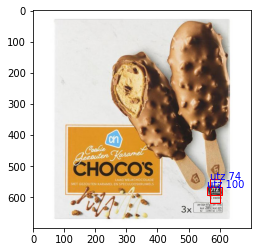

------------------------------------------------------
19755d770690b27e6bcc9eda69f311bb.jpg
True certificates: ['bio']
Prediction (+ certainty)
bio : 100 %


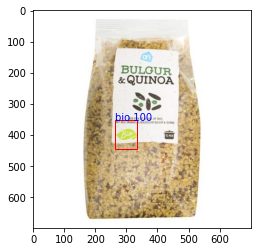

------------------------------------------------------
854f6f77ff8df0e23fcd2d85a41ba14c.jpg
True certificates: ['organic', 'vegan']
Prediction (+ certainty)
organic : 100 %
vegan : 98 %


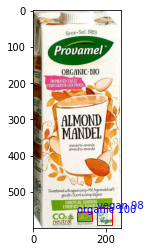

------------------------------------------------------
eko25.jpg
True certificates: ['beterleven3']
Prediction (+ certainty)
beterleven3 : 100 %


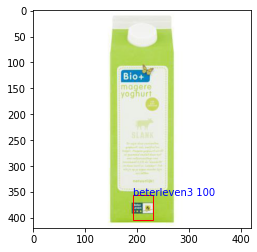

------------------------------------------------------
9c7ea074e572e19383001fbc41f25fab.jpg
True certificates: ['organic', 'vegan']
Prediction (+ certainty)
organic : 98 %
vegan : 97 %


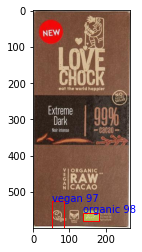

------------------------------------------------------
beterleven161.jpg
True certificates: ['beterleven1']
Prediction (+ certainty)
beterleven2 : 98 %
beterleven2 : 97 %


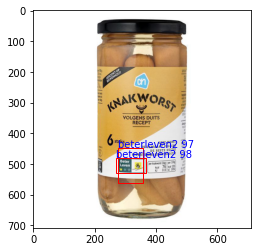

------------------------------------------------------
beterleven283.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 96 %


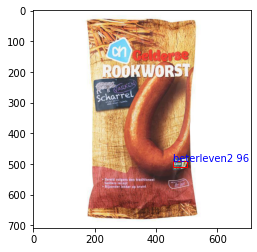

------------------------------------------------------
demeter71.jpg
True certificates: ['demeter']
Prediction (+ certainty)
demeter : 100 %


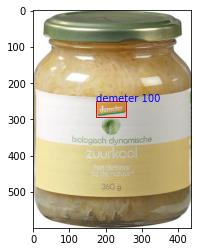

------------------------------------------------------
ad415408f0c5df5cc950d69bd3bc6e36.jpg
True certificates: ['fairtrade']
Prediction (+ certainty)
fairtrade : 87 %


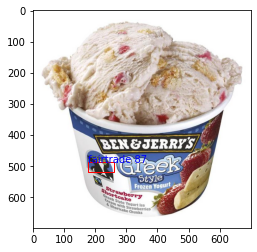

------------------------------------------------------
49b09cb92628e418466e32b625882924.jpg
True certificates: ['planetproof']
Prediction (+ certainty)
planetproof : 100 %


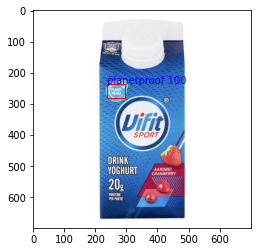

------------------------------------------------------
beterleven211.jpg
True certificates: ['beterleven2']
Prediction (+ certainty)
beterleven2 : 99 %


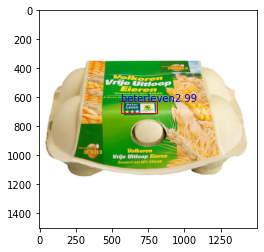

------------------------------------------------------
21357e8ad6bde15f1bf3a5ea515e5b57.jpg
True certificates: ['bio']
Prediction (+ certainty)
bio : 100 %
bio : 99 %


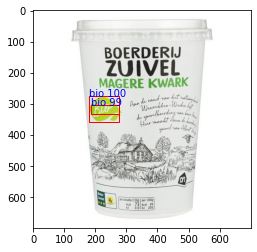

------------------------------------------------------
msc83.jpg
True certificates: ['msc']
Prediction (+ certainty)
msc : 100 %
msc : 100 %


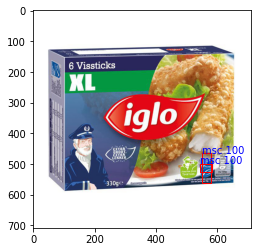

------------------------------------------------------
83ccedfbbec2dfd6cdf85d3b0c49a3a3.jpg
True certificates: ['organic']
Geen keurmerk gescout!
Prediction (+ certainty)


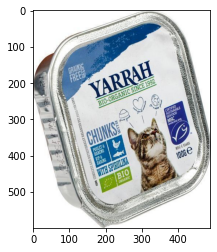

------------------------------------------------------
bfaa50ebe280dadd4cf7ae803c3b1b2d.jpg
True certificates: ['weidemelk']
Prediction (+ certainty)
weidemelk : 100 %
weidemelk : 89 %


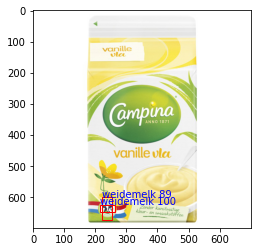

------------------------------------------------------
5a5658326e3724456b1ab77677563351.jpg
True certificates: ['eko']
Prediction (+ certainty)
fairtrade : 90 %


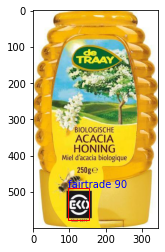

------------------------------------------------------
7d1931a04cb52db618390199317a9b90.jpg
True certificates: ['utz']
Prediction (+ certainty)
utz : 100 %
utz : 95 %


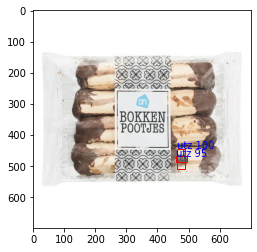

------------------------------------------------------


In [33]:
def keurmerk_predict(print_results=False, min_prob=30, iou_tres = 0.2):
    # Model path variables
    #make dataframe with FILENAME, LABEL_TRUE, LABEL_PRED, only do this if iou of boxes overlaps
    df_confusion = pd.DataFrame(columns=['filename', 'label_true', 'label_predicted'])
    df_true['gelinked'] = False

    image_path = TEST_DIR + '/images/'
    nr_keurmerken=0

    dtc = CustomObjectDetection()
    dtc.setModelTypeAsYOLOv3()
    dtc.setModelPath(MODEL_PATH)
    dtc.setJsonPath(JSON_PATH)
    dtc.loadModel()

    for f in os.listdir(image_path):
          print(f)
          km = what_labels_in_xml(image_path + f)
          print('True certificates: ' + str(km))
          detections = dtc.detectObjectsFromImage(input_image= image_path + f,
                                                output_image_path=RESULTS_DIR + f,
                                                minimum_percentage_probability=70,
                                                display_percentage_probability=True,
                                                display_object_name=True,
                                                nms_treshold=0.5, 
                                                )

          # Print detection results detected in input image
          if print_results is True:
            probs = []
            boksen = []
            klassen = []
            for detection in detections:
               # make a list 
                probs.append(detection['percentage_probability'])
                boksen.append(detection['box_points'])
                klassen.append(detection['name'])

          #apply personal NMS if anything has been found
          probs = np.array(probs)
          boksen = np.array(boksen)
          klassen = np.array(klassen)

          true_cert_indexes = df_true[df_true['filename'] == f].index

          if (len(probs) > 0):
            [probs, boksen, klassen] = yolo_non_max_suppression(scores = probs, boxes = boksen, classes = klassen)

            #in df_confusion: link detectie aan gelabeld keurmerk met iou >= 0.5, als deze er niet zijn, voeg een false positive toe
            #sla ook false negatives op in df_true
            #gaat per gevonden label alle daadwerkelijke labels af
            for i in range(len(klassen)) : 
              gelinked = False #indicator of deze vinding gelinked is aan een true_certificate
              box_pred = boksen[i]
              certificate_pred = klassen[i]

              #ga alle gelabelde keurmerken af (indien die er zijn)
              #als die er niet zijn, dan blijft deze vinding ongelinked (en dus gaat hij als false positive df_confusion in)
              if (len(true_cert_indexes) > 0):
                for i in true_cert_indexes:
                  certificate_true = df_true.loc[i, 'label_true']
                  box_true = df_true.loc[i, ['xmin', 'ymin','xmax','ymax']]
                  
                  #als iou >= 0.5, maak een df aan met filename, echte certificaat, gedetecteerde certificaat
                  #zet gelinked op true voor deze detectie
                  #zet in dataframe dat dit keurmerk gelinked is
                  if iou(box_true ,box_pred ) >= iou_tres :
                    nr_keurmerken = nr_keurmerken + 1
                    df_confusion = df_confusion.append(pd.DataFrame(data =[[f, certificate_true, certificate_pred]], columns=['filename', 'label_true', 'label_predicted']), ignore_index=False)
                    gelinked = True
                    df_true.loc[i, 'gelinked'] = True
            
              #als deze detectie niet gelinked is, voeg dan rij aan dt toe waarin een 'false positive' wordt aangegeven als true label
              if (gelinked == False) :
                df_confusion = df_confusion.append(pd.DataFrame(data = [[f, 'no_certificate', certificate_pred]], columns=['filename', 'label_true', 'label_predicted']), ignore_index=True)            

          else:
            print('Geen keurmerk gescout!')

          plot_yolo(image_path, f, probs, boksen, klassen)
          print('------------------------------------------------------')

    #add columns of certificates that were not detected (false negatives)
    # add false negatives to df_true
    df_false_negs = df_true.loc[df_true['gelinked'] == 0, ['filename', 'label_true']]
    df_false_negs['label_predicted'] = 'not_detected' 
    df_confusion = df_confusion.append(df_false_negs[['filename','label_true',  'label_predicted']], ignore_index=True)
    return df_confusion, nr_keurmerken


if __name__ == "__main__":
    df_confusion,nr_keurmerken = keurmerk_predict(print_results=True)


**Confusion Matrix**


In [34]:
def plot_confusion_matrix(cm, classes,
                        normalize=False,
                        title='Confusion matrix',
                        cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize = (17,17))
    plt.imshow(cm, interpolation='nearest', cmap=cmap) # ,aspect='auto')
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], fontsize=10,
            horizontalalignment="center",
            color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')


def create_confusion_matrix(df_confusion, cm_plot_labels) : 
  df_cm = pd.DataFrame(columns = cm_plot_labels)
  df_cm.set_index(keys=cm_plot_labels)

  for lab1 in cm_plot_labels :
    for lab2 in cm_plot_labels :
      df_cm.loc[lab1, lab2] = len(df_confusion[(df_confusion['label_true'] == lab1) & (df_confusion['label_predicted'] == lab2)])

  return df_cm


Confusion matrix, without normalization
[[20  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0 18  8  0  0  0  0  0  0  0  0  0  0  0  0  0  1]
 [ 0  0 19  1  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  9  0  0  0  0  0  0  0  0  0  0  0  0  1]
 [ 0  0  0  0 16  0  0  0  0  0  0  0  0  0  0  0  1]
 [ 0  0  0  0  0 17  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0 12  2  0  0  0  0  1  0  0  0  5]
 [ 0  0  0  0  0  0  0 38  0  0  0  0  0  0  0  0  3]
 [ 0  0  0  0  0  0  0  0 19  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  1  0  0  0 45  0  0  0  0  0  0  3]
 [ 0  0  0  0  0  0  0  0  0  0 16  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0 10  0  0  0  0  1]
 [ 0  0  0  0  0  0  0  0  0  0  0  0 19  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  6  0  0  7]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0 25  0  0]
 [ 0  1  1  0  1  2  0  3  0  3  0  0  1  2  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]]
Total false positives :14
Total false neg

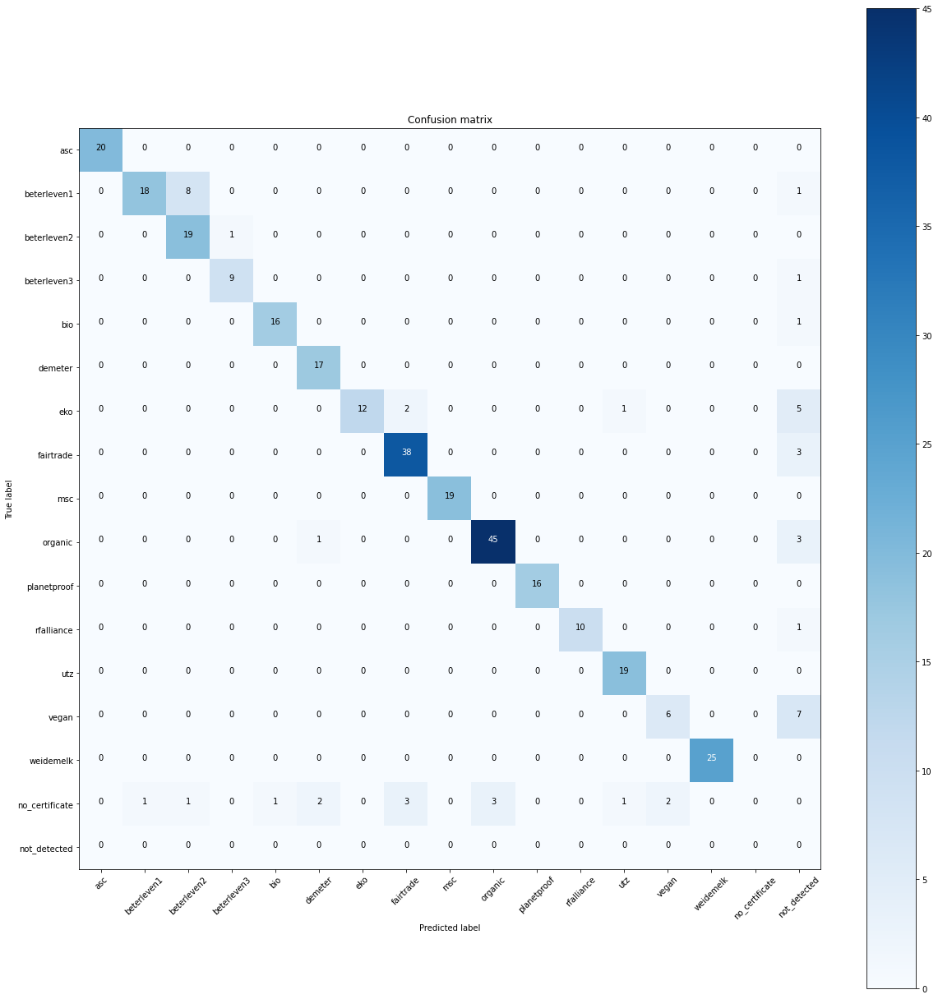

In [35]:
cm_plot_labels = [
                  'asc',
                  'beterleven1',
                  'beterleven2',
                  'beterleven3',
                  'bio',
                  'demeter',
                  'eko',
                  'fairtrade',
                  'msc',
                  'organic',
                  'planetproof',
                  'rfalliance',
                  'utz',
                  'vegan',             
                  'weidemelk',
                  'no_certificate',
                  'not_detected'               
    ]

df_cm = create_confusion_matrix(df_confusion, cm_plot_labels)
plot_confusion_matrix(df_cm.to_numpy().astype('int'), cm_plot_labels)

print('Total false positives :' +  str(len(df_confusion[df_confusion['label_true'] == 'no_certificate'])) )
print('Total false negatives :' +  str(len(df_confusion[df_confusion['label_predicted'] == 'not_detected'])) )

In [36]:
df1 = pd.DataFrame(data=[['hee','hoi','hallo'], ['nee', 'maar', 'nouja']], columns=['zei','ik','toch'])
df2 = pd.DataFrame(data=[['nou','ja','nee'], ['lie', 'ver', 'niet'], ['nee', 'jij', 'dan']], columns=['zei','ik','toch'])
df = df1.append(df2, ignore_index=True)
df

,zei,ik,toch
0,hee,hoi,hallo
1,nee,maar,nouja
2,nou,ja,nee
3,lie,ver,niet
4,nee,jij,dan
